<h1>Coffee or Beer in London - Your Choice!</h1>

<a id="0"><h4>Content</h4></a>  
* <a href="#1">Introduction</a>  
* <a href="#2">Previous work</a>  
* <a href="#3">Analysis preparation</a>  
* <a href="#4">Geospatial analysis</a>  
* <a href="#5">Summary of findings</a>  


# <a id="1">Introduction</a>   

I created intially this Kernel in R and I was aiming to simplify the choice between tasting an ale or enjoying a coffee for a traveler or local in London. If I am in a Starbucks shop, how many pubs are closer to me than to the next Starbucks? Can I select the pubs that are closer to a Starbucks than to another? What is the area covered by a pub or by a Starbucks? How are these areas interwined? Are some Starbucks neighborhoods more crowded with pubs than anothers? How many Starbucks and how many pubs are actually in London ? All these questions can be now answered.   

The datasets included in this analysis are:  
* [Every Pub in England](https://www.kaggle.com/datasets/rtatman/every-pub-in-england) - data about all pubs in England, but also data from Wales and Scotland (although probably incomplete)    
* [Starbucks Locations Worldwide](https://www.kaggle.com/datasets/starbucks/store-locations) - data about all Starbooks cofee shops in the World  


Aditional datasets resources:
* [GADM Data for UK](https://www.kaggle.com/datasets/gpreda/gadm-data-for-uk) - ESRI shapefile data with administrative units in United Kingdom, at overall level (including England, Wales, Scotland and Northern Ireland), at country level (with above mentioned countries boundaries included) and at local administrative unit level (counties, big municipalities, boroughs of London) - it is used to clip the polygons built from pubs and Starbucks locations to boundaries
* [Open Postcode Geo](https://www.kaggle.com/datasets/danwinchester/open-postcode-geo) - Dataset with Postcodes and their corresponding latitude and longitude - it is used to recover latitude and longitude from postcode in the Every Pub in England dataset.

---
<div style="float: right;">
        <a href="#0" class="button btn-info btn-sm" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="Go to Top">Go to Top</a>
</div>

# <a id="2">Previous work</a>

Few other Notebooks are related to this one.  

These Notebooks are focusing on each dataset included in our analysis:  
* An analysis of [Every Pub in England](https://www.kaggle.com/datasets/rtatman/every-pub-in-england) dataset can be found in [Every Pub in England - Data Exploration](https://www.kaggle.com/code/gpreda/every-pub-in-england-data-exploration)  
* [Starbucks Locations Worldwide](https://www.kaggle.com/datasets/starbucks/store-locations) is analyzed in [Starbucks Locations Worldwide - Data Exploration](https://www.kaggle.com/code/gpreda/starbucks-location-worldwide-data-exploration)  

I developed these two Notebooks in R, few years ago:  

* [Beer or Coffee in London - Tough Choice? No more!](https://www.kaggle.com/code/gpreda/beer-or-coffee-in-london-tough-choice-no-more/)   
* [Map with Every Pub in England](https://www.kaggle.com/code/gpreda/map-with-every-pub-in-england)   




---
<div style="float: right;">
        <a href="#0" class="button btn-info btn-sm" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="Go to Top">Go to Top</a>
</div>

# <a id="3">Analysis preparation</a>

## Import packages

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import matplotlib

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
from plot_style_utils import set_color_map
from geospatial_utils import get_voronoi_polygons, plot_voronoi_polygons,\
                             extract_voronoi_polygon_list, clip_polygons,\
                             within_polygon, get_polygons_area

## Read the data


### UK pubs

In [3]:
pub_df = pd.read_csv("/kaggle/input/every-pub-in-england/open_pubs.csv")

### Starbucks cofee shops

In [4]:
coffee_df = pd.read_csv("/kaggle/input/store-locations/directory.csv")

### Shapefiles with UK local authorities

In [5]:
counties_df = gpd.read_file("/kaggle/input/gadm-data-for-uk/GBR_adm2.shp")

### Open postcode geo

In [6]:
post_code_df = pd.read_csv("/kaggle/input/open-postcode-geo/open_postcode_geo.csv", header=None, low_memory=False)
post_code_df = post_code_df[[0, 6, 7, 8]]
post_code_df.columns = ['postcode', 'country', 'latitude', 'longitude']

## Color scheme for the Notebook

Notebook Color Schema:


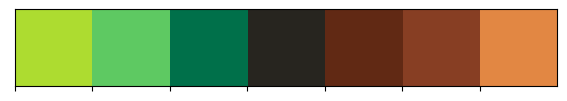

In [7]:
color_list = ['#ADDC30', '#5EC962', "#00704A", "#27251F", "#612914", "#873E23","#E28743"]
cmap_custom = set_color_map(color_list)

## Prepare the data   

First, we filter the pubs. Only those in the boroughs of London will be kept.

In [8]:
london_boroughs = ["Barking and Dagenham","Barnet","Bexley","Brent","Bromley","Camden","Croydon","Ealing","Enfield",
  "Greenwich","Hackney","Hammersmith and Fulham","Haringey","Harrow","Havering","Hillingdon","Hounslow","Islington",
  "Kensington and Chelsea","Kingston upon Thames","Lambeth","Lewisham","Merton","Newham","Redbridge","Richmond upon Thames",
  "Southwark","Sutton","Tower Hamlets","Waltham Forest","Wandsworth","Westminster", "City of London"]

In [9]:
pub_df = pub_df.loc[pub_df.local_authority.isin(london_boroughs)]

Let's check that all the London boroughs are present in our selection.

In [10]:
print("London boroughs: ", len(london_boroughs))
print("Local authorities selected: ", pub_df.local_authority.nunique())
print("Differences: ", len(set(london_boroughs) - set(pub_df.local_authority.unique())),\
      len(set(pub_df.local_authority.unique()) - set(london_boroughs)))

London boroughs:  33
Local authorities selected:  33
Differences:  0 0


Let's quickly use shapefiles to verify that we filtered correctly all.

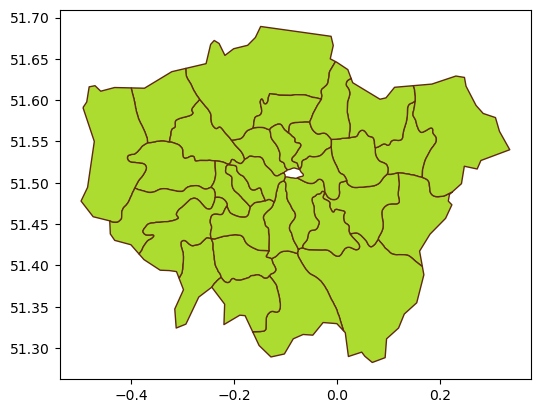

In [11]:
boroughs_df = counties_df.loc[counties_df.NAME_2.isin(london_boroughs)]
boroughs_df.plot(color=color_list[0], edgecolor=color_list[4])
plt.show()

Aparently we do have a problem, since `City of London` doesn't seems to be included in our selection. We will have to retry the selection, adding to `london_boroughs` also `London`.

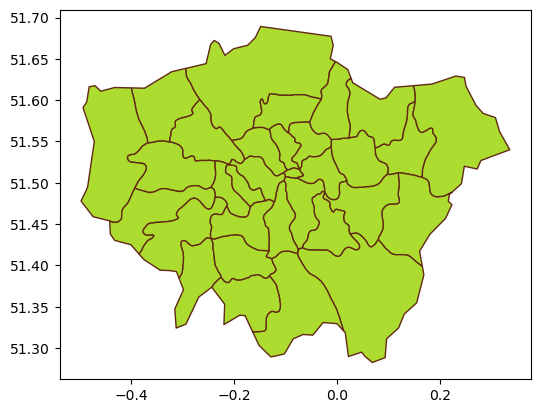

In [12]:
boroughs_df = counties_df.loc[counties_df.NAME_2.isin(london_boroughs + ["London"])]
boroughs_df.plot(color=color_list[0], edgecolor=color_list[4])
plt.show()

Now we do have all data included. To fix the unalignment between the name used for `City of London` in the two datasets, we will replace in `counties_df` `London` with `City of London`.

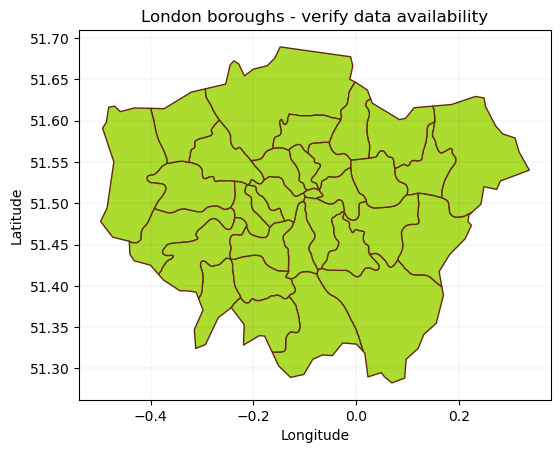

In [13]:
counties_df.loc[counties_df.NAME_2=="London", "NAME_2"] = "City of London"
boroughs_df = counties_df.loc[counties_df.NAME_2.isin(london_boroughs)]
boroughs_df.plot(color=color_list[0], edgecolor=color_list[4])
plt.xlabel("Longitude"); plt.ylabel("Latitude"); plt.title("London boroughs - verify data availability")
plt.grid(color="black", linestyle=":", linewidth=0.1, axis="both", which="major")
plt.show()

Let's filter now also the Starbucks data.

In [14]:
coffee_df = coffee_df.loc[(coffee_df.City.isin(london_boroughs + ["London"])) &\
             (coffee_df.Country=="GB")]

### Check geolocation of selected items   

Let's check now that selcted pubs and selected Starbucks are all included in the area of London borougs.  

First, we fix the pubs missing latitude and longitude.

In [15]:
pub_df.loc[(pub_df.longitude=="\\N"), 'longitude'] = None
pub_df.loc[(pub_df.latitude=="\\N"), 'latitude'] = None
postcode_with_none_lat_long = pub_df.loc[(pub_df.longitude.isna()) & (pub_df.latitude.isna()), "postcode"].unique()
post_code_df = post_code_df.loc[post_code_df.postcode.isin(postcode_with_none_lat_long)]
pub_df = pub_df.merge(post_code_df, on="postcode", how="left")
pub_df['latitude'] = pub_df['latitude_x'].fillna(pub_df['latitude_y'])
pub_df['longitude'] = pub_df['longitude_x'].fillna(pub_df['longitude_y'])
pub_df = pub_df.drop(["latitude_x", "latitude_y", "longitude_x", "longitude_y"], axis=1)
pub_df["latitude"] = pub_df["latitude"].apply(lambda x: float(x))
pub_df["longitude"] = pub_df["longitude"].apply(lambda x: float(x))

Let's quickly check the result.

In [16]:
pub_df.head()

,fas_id,name,address,postcode,easting,northing,local_authority,country,latitude,longitude
0,17283,The Three Jolly Wheelers,"735 Chigwell Road, Woodford Green, Chigwell, E...",IG8 8AS,542653,192011.0,Redbridge,NaN,51.608869,0.058699
1,83420,Aria Bar,"31 Longbridge Road, Barking",IG11 8TN,544481,184425.0,Barking and Dagenham,NaN,51.540240,0.081962
2,83454,Barking Arms Ltd,"25-27 Station Parade, Barking",IG11 8TU,544404,184344.0,Barking and Dagenham,NaN,51.539531,0.080819
3,83461,Barking football Club,"Barking Football Club, Lodge Avenue, Dagenham",RM8 2JR,546614,185058.0,Barking and Dagenham,NaN,51.545377,0.112960
4,83464,Barking Indoor Bowls Club Ltd,"Indoor Bowls Hall, Barking Prk, Longbridge Roa...",IG11 8TA,544692,184653.0,Barking and Dagenham,NaN,51.542225,0.085096


In [17]:
def verify_data_availability():
    f, ax = plt.subplots(1, 1, figsize=(10, 10))
    boroughs_df.plot(color="white", edgecolor=color_list[4], ax=ax)
    plt.scatter(x=pub_df["longitude"],y=pub_df["latitude"], color=color_list[0], marker="+", label="Pubs")
    plt.scatter(x=coffee_df["Longitude"],y=coffee_df["Latitude"], color=color_list[5], marker="o", label="Starbucks")
    plt.xlabel("Longitude"); plt.ylabel("Latitude"); plt.title("London boroughs - verify data availability")
    plt.grid(color="black", linestyle=":", linewidth=0.1, axis="both", which="major")
    plt.legend()
    plt.show()

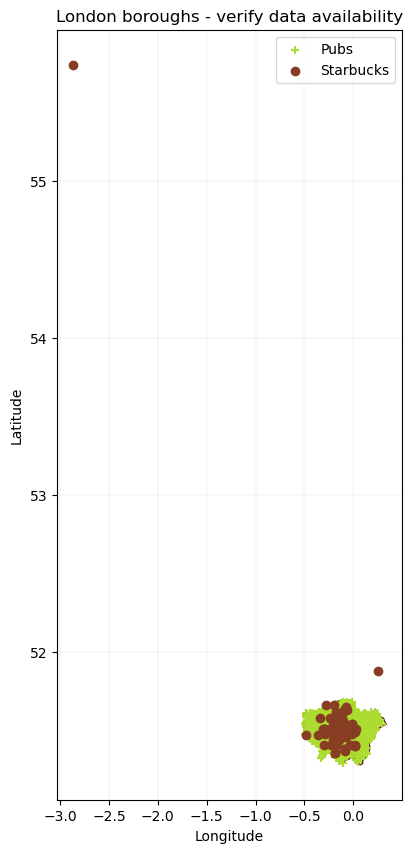

In [18]:
verify_data_availability()

We will have to remove the two parasite coffee shops with latitude above 51.7

In [19]:
coffee_df.loc[coffee_df.Latitude>51.7]

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
5644,Starbucks,14945-154366,Stansted Airport DT,Franchise,"A120 Thermal Lane, London Stansted Airport",London,ENG,GB,CM24 1PY,01279 680361,GMT+0:00 Europe/London,0.25,51.88
5801,Starbucks,18674-194126,SSP London Victoria Platform 2,Licensed,"Victoria Station, Platform 2 Unit 3B, 15 Victo...",London,ENG,GB,SW1W 0SH,NaN,GMT+0:00 Europe/London,-2.87,55.74


Both locations are aparently in London, judging by the address (or ar a close location, if is about the Stansted Airport), but are not withing the borders of London boroughs.  
Therefore we remove them.

In [20]:
coffee_df = coffee_df.loc[coffee_df.Latitude<=51.7]

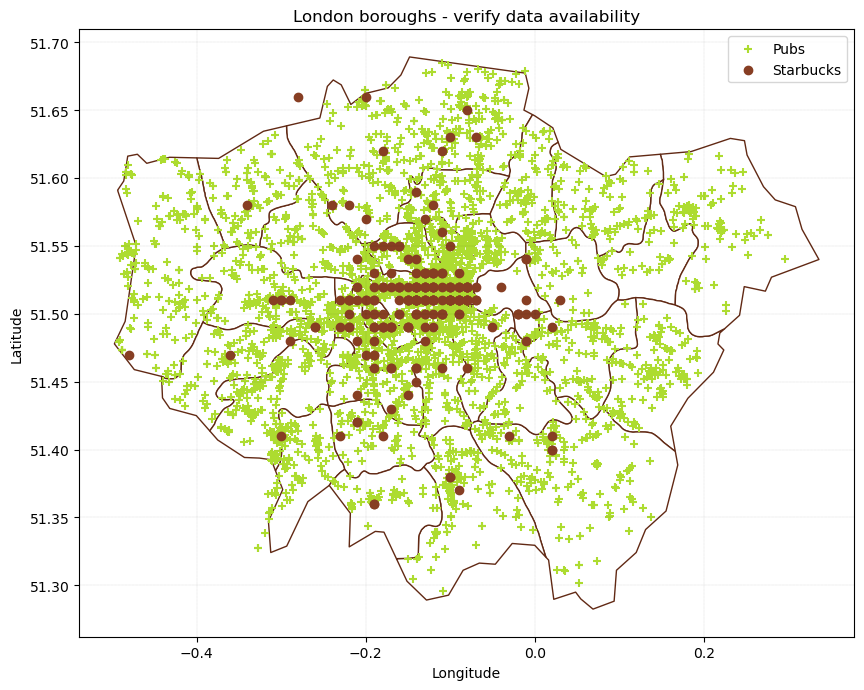

In [21]:
verify_data_availability()

We still have few pubs and Starbucks that are outside the boroughs borders. For now we keep them. We will eliminate them eventualy later in our analysis, when we will use the boroughs borders to clip the content.  

We are ready now to start our geospatial analysis.

---
<div style="float: right;">
        <a href="#0" class="button btn-info btn-sm" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="Go to Top">Go to Top</a>
</div>

# <a id="4">Geospatial analysis</a>


Let's start with displaying the Voronoi polygons generated from pubs in London area. First we show the Voronoi polygons not clipped, then clipped using the London boroughs shapefile data.

In [22]:
pub_voronoi = get_voronoi_polygons(pub_df)

Voronoi polygons: 4525


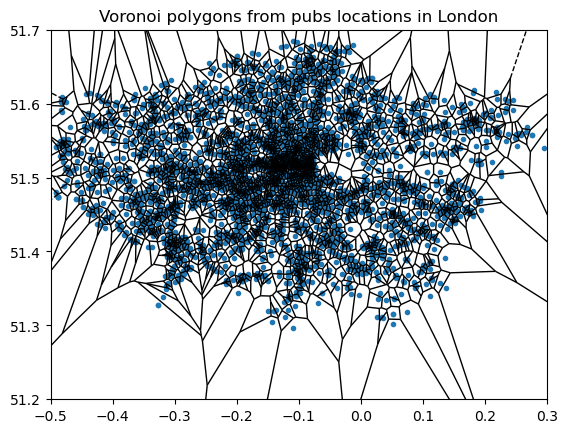

In [23]:
plot_voronoi_polygons(pub_voronoi, 
                      title="Voronoi polygons from pubs locations in London",
                      lat_limits=[51.2, 51.7],
                      long_limits=[-0.5, 0.3])

Let's extract a list of polygons from the Voronoi polygons object.

In [24]:
voronoi_poly_list = extract_voronoi_polygon_list(pub_voronoi)

We obtain from the collection of polygons with London boroughs, by dissolving, the external boundary contour.

In [25]:
boroughs_dissolved = boroughs_df.dissolve()

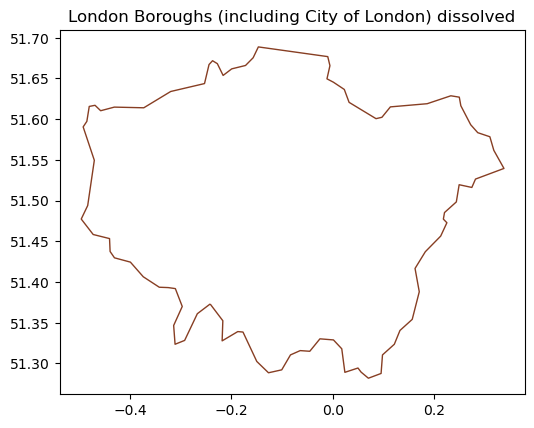

In [26]:
fig, ax = plt.subplots(1, 1, figsize = (6, 6))
boroughs_dissolved.plot(ax = ax, color = "white", edgecolor = color_list[5])
plt.title("London Boroughs (including City of London) dissolved")
plt.show()

Let's obtain the collection of Voronoi polygons from pubs cliped with the `borroughs_dissolved` polygon. We do not need to pass this object to the function, will just pass the original object `boroughs_df`.

In [27]:
voronoi_polys_clipped = clip_polygons(voronoi_poly_list, boroughs_df)

Total time: 0.131 sec.


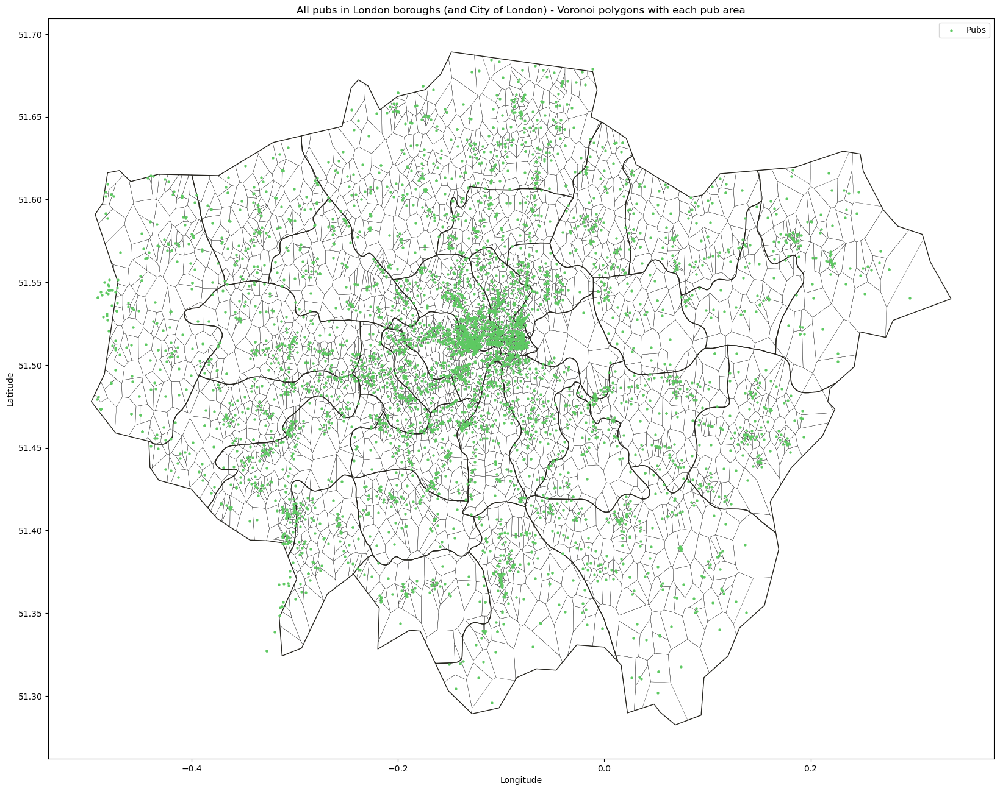

In [28]:
fig, ax = plt.subplots(1, 1, figsize = (20, 20))
ax.set_facecolor("white")
voronoi_polys_clipped.plot(ax = ax, color="white", edgecolor = 'black', linewidth = 0.25, label="Voronoi polygons (pubs)")
boroughs_df.plot(ax = ax, color = 'none', edgecolor = color_list[3], linewidth = 1, label="boroughs")
plt.scatter(x=pub_df["longitude"],y=pub_df["latitude"], color=color_list[1], marker=".", linewidth = 0.1, label="Pubs")
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("All pubs in London boroughs (and City of London) - Voronoi polygons with each pub area")
plt.legend()
plt.show()

Let's repeat the same process for Starbucks coffee shops in London area.

Voronoi polygons: 209


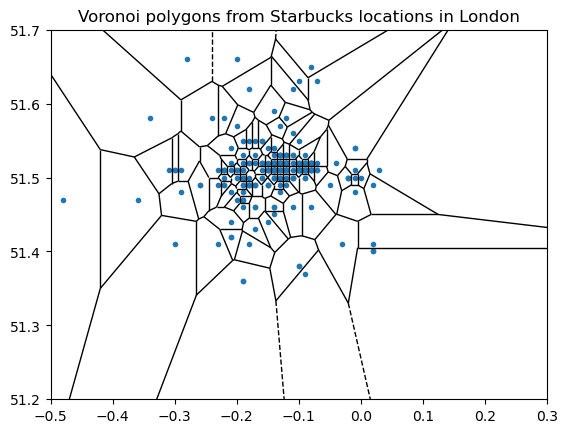

In [29]:
coffee_voronoi = get_voronoi_polygons(coffee_df, latitude="Latitude", longitude="Longitude")
plot_voronoi_polygons(coffee_voronoi, 
                      title="Voronoi polygons from Starbucks locations in London",
                      lat_limits=[51.2, 51.7],
                      long_limits=[-0.5, 0.3])

In [30]:
coffee_voronoi_poly_list = extract_voronoi_polygon_list(coffee_voronoi)
coffee_voronoi_polys_clipped = clip_polygons(coffee_voronoi_poly_list, boroughs_df)

Total time: 0.0227 sec.


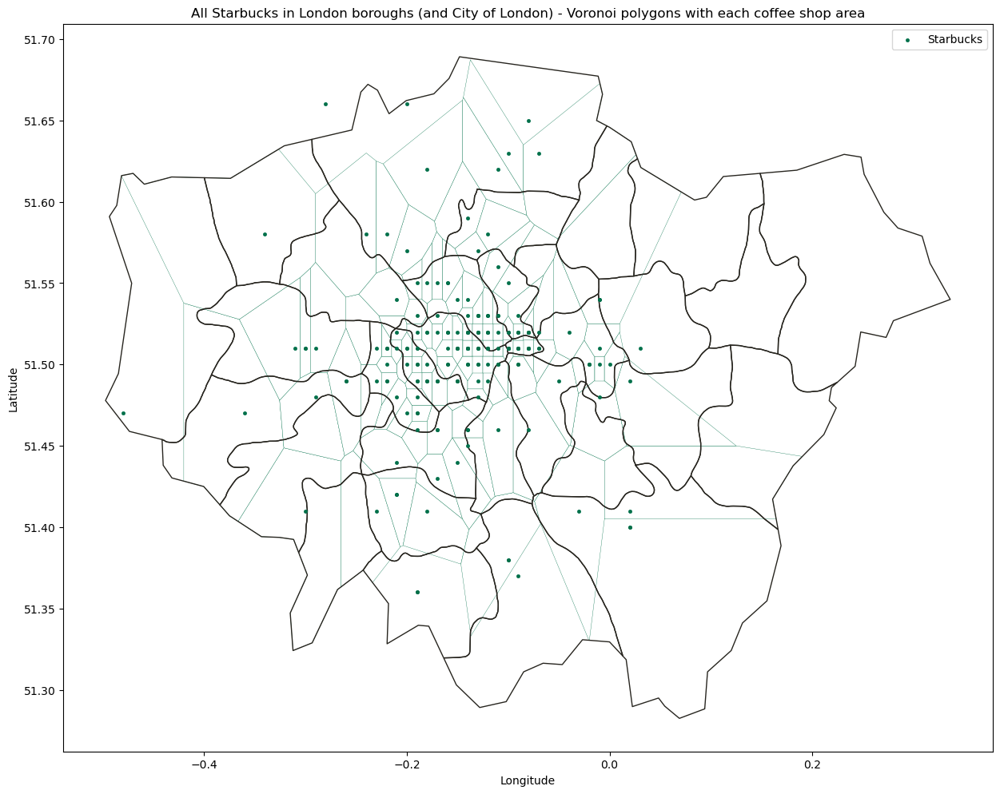

In [31]:
fig, ax = plt.subplots(1, 1, figsize = (15, 15))
ax.set_facecolor("white")
coffee_voronoi_polys_clipped.plot(ax = ax, color="white", edgecolor = color_list[2], linewidth = 0.25, label="Voronoi polygons (Starbucks)")
boroughs_df.plot(ax = ax, color = 'none', edgecolor = color_list[3], linewidth = 1, label="boroughs")
plt.scatter(x=coffee_df["Longitude"],y=coffee_df["Latitude"], color=color_list[2], marker=".", linewidth = 0.5, label="Starbucks")
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("All Starbucks in London boroughs (and City of London) - Voronoi polygons with each coffee shop area")
plt.legend()
plt.show()

Let's visualize Starbucks Voronoi polygons and the pubs, to see what pubs are included in each Starbucks area.

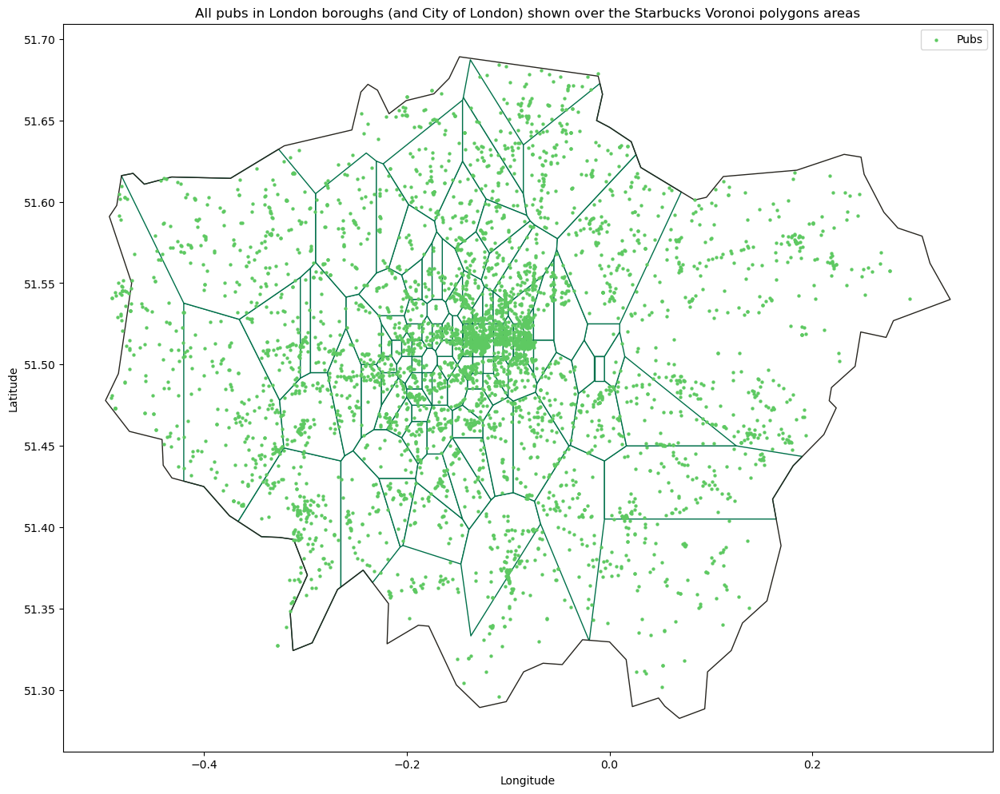

In [32]:
fig, ax = plt.subplots(1, 1, figsize = (15, 15))
coffee_voronoi_polys_clipped.plot(ax = ax, color="white", edgecolor = color_list[2], linewidth = 1)
ax.set_facecolor("white")
boroughs_dissolved.plot(ax = ax, color = "none", edgecolor = color_list[3], linewidth = 1)
plt.scatter(x=pub_df["longitude"],y=pub_df["latitude"], color=color_list[1], marker=".", linewidth = 0.1, label="Pubs")
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("All pubs in London boroughs (and City of London) shown over the Starbucks Voronoi polygons areas")
plt.legend()
plt.show()

Let's show all pubs inside a certain Starbucks area with red (the selected Starbucks area highlighted with light green) and the rest of pubs with black.

In [33]:
data_in_df, data_out_df, sel_polygon_gdf = within_polygon(pub_df, coffee_voronoi_poly_list[6])

In [34]:
def plot_pubs_inside_outside_starbucks_area():
    fig, ax = plt.subplots(1, 1, figsize = (15, 15))
    coffee_voronoi_polys_clipped.plot(ax = ax, color="white", edgecolor = color_list[2], linewidth = 1)
    sel_polygon_gdf.plot(ax = ax, color=color_list[2], edgecolor = color_list[2], linewidth = 1)
    ax.set_facecolor("white")
    boroughs_dissolved.plot(ax = ax, color = "none", edgecolor = color_list[2], linewidth = 1)
    plt.scatter(x=data_in_df["long"],y=data_in_df["lat"], color=color_list[6], marker=".", linewidth = 0.1, label="Pubs Inside")
    plt.scatter(x=data_out_df["long"],y=data_out_df["lat"], color=color_list[0], marker=".", linewidth = 0.1, label="Pubs Outside")
    plt.xlabel("Longitude"); plt.ylabel("Latitude");
    plt.title("All pubs in London boroughs (and City of London) inside and outside selected Starbucks Voronoi polygon area")
    plt.legend()
    plt.show()

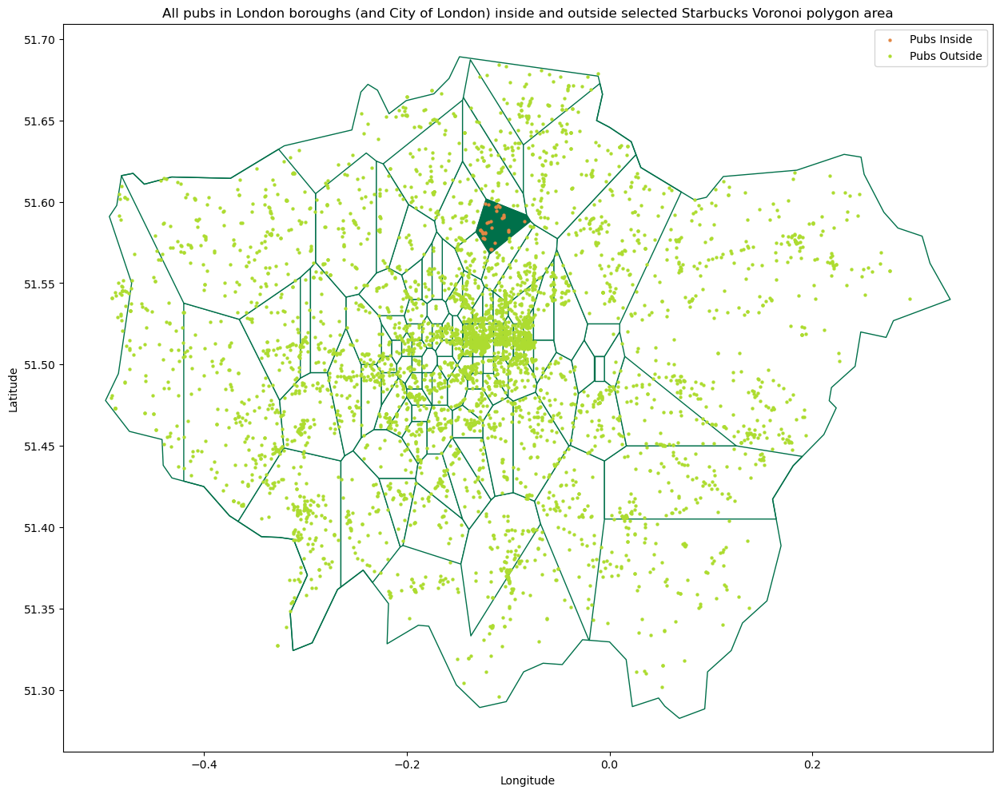

In [35]:
plot_pubs_inside_outside_starbucks_area()

In [36]:
data_in_df, data_out_df, sel_polygon_gdf = within_polygon(pub_df, coffee_voronoi_poly_list[12])

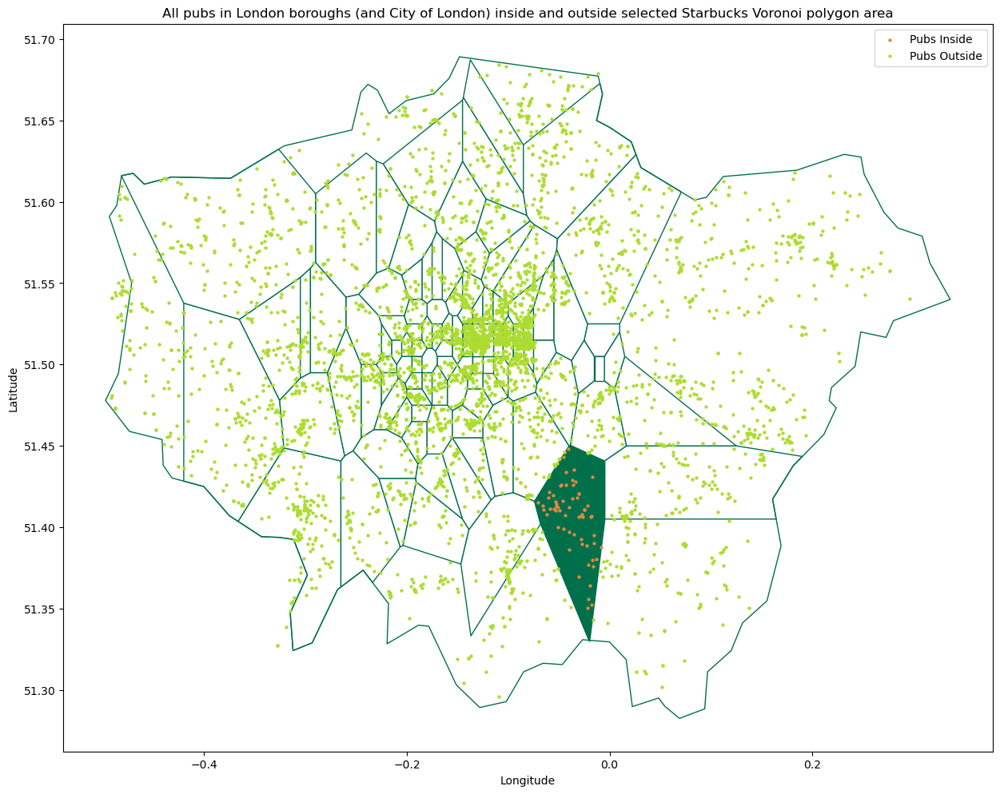

In [37]:
plot_pubs_inside_outside_starbucks_area()

We can represent  the pubs and Starbucks using folium maps. These have the advantage that can be browsed.  

Let's start with representing the London boroughs as the first layer of the map. On top of it, we will show the pubs in London area. Each pub will have as well a popup displaying the name of the pub and the address.

In [38]:
# map with zoom on London area
m = folium.Map(location=[51.5, 0], zoom_start=10, tiles="Stamen Toner")
# London boroughs geo jsons
for _, r in boroughs_df.iterrows():
    simplified_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_json = simplified_geo.to_json()
    geo_json = folium.GeoJson(data=geo_json,
                           style_function=lambda x: {'fillColor': color_list[1],
                                                    'color': color_list[2],
                                                    'weight': 1})
    geo_json.add_to(m)

# pubs as CircleMarkers with popup with Name & Address info    
for _, r in pub_df.iterrows():
    folium.CircleMarker(location=[r['latitude'], r['longitude']],
                        fill=True,
                        color=color_list[4],
                        fill_color=color_list[5],
                        weight=0.5,
                        radius=4,
                        popup="<strong>Name</strong>: <font color='red'>{}</font> <br> <strong>Address</strong>: {}".format(r['name'], r['address'])).add_to(m)
# display map
m    

Next, we visualize the Starbucks locations over the London boroughs area. Each Starbucks coffee shop will also have a popup with the following information displayed:
- Store Name  
- Ownership Type  
- Street Address

In [39]:
# map with London area
m = folium.Map(location=[51.5, 0], zoom_start=10, tiles="CartoDB positron")

# add just the boroughs border
simplified_geo = gpd.GeoSeries(boroughs_dissolved[0:1]['geometry']).simplify(tolerance=0.001)
geo_data = folium.GeoJson(data=simplified_geo.to_json(),
                          style_function=lambda x: {'fillColor': color_list[0],
                                                    'color': color_list[2],
                                                    'weight': 1})
geo_data.add_to(m)

# add Starbucks coffee shops with popup displaying Store Name, Ownership Type, and Street Address  
for _, r in coffee_df.iterrows():
    folium.CircleMarker(location=[r['Latitude'], r['Longitude']],
                        fill=True,
                        color=color_list[2],
                        fill_color=color_list[2],
                        weight=0.5,
                        radius=4,
                        popup="<strong>Store Name</strong>: <font color='red'>{}</font><br><strong>Ownership Type</strong>:{}<br>\
                        <strong>Street Address</strong>: {}".format(r['Store Name'], r['Ownership Type'],r['Street Address'])).add_to(m)
# display the map
m    

Let's visualize now the Voronoi polygons associated with Starbucks and the pubs locations, over the boroughs disolved layer. In this way we can see what pubs (with their name and address) are located in each Starbucks coffee shop area.

In [40]:
# map zoom-in on London boroughs area
m = folium.Map(location=[51.5, 0], zoom_start=10, tiles='Stamen toner')

# add just the boroughs border
simplified_geo = gpd.GeoSeries(boroughs_dissolved[0:1]['geometry']).simplify(tolerance=0.001)
folium.GeoJson(data=simplified_geo.to_json(),
               style_function=lambda x: {'fillColor': color_list[0],
                                         'color': color_list[2],
                                         'weight': 1}).add_to(m)
    
# add Starbucks Voronoi polygons    
for _, r in coffee_voronoi_polys_clipped.iterrows():
    # simplify the representation of each area, to make sure the map is displayed
    simplified_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_json = simplified_geo.to_json()
    # add to map
    folium.GeoJson(data=geo_json,
                           style_function=lambda x: {'fillColor': color_list[0],
                                                     'color': color_list[2],
                                                    'weight': 1,
                                                    'opacity': 1}).add_to(m)
# pubs as CircleMarkers with popup with Name & Address info  
for _, r in pub_df.iterrows():
    folium.CircleMarker(location=[r['latitude'], r['longitude']],
                        fill=True,
                        color=color_list[4],
                        fill_color=color_list[5],
                        weight=0.5,
                        radius=4,
                        popup="<strong>Name</strong>: <font color='red'>{}</font> <br> <strong>Address</strong>: {}".format(r['name'], r['address'])).add_to(m)
# display the map
m

Let's also show the density of pubs per London boroughs.  
We aggregate the pubs on local authority and then we merge with borougs_df.

In [41]:
agg_pub_df = pub_df.groupby("local_authority")["name"].count().reset_index()
agg_pub_df.columns = ["NAME_2", "pubs"]
boroughs_df = boroughs_df.merge(agg_pub_df)

Let's also calculate the area of each borough.

In [42]:
boroughs_df = get_polygons_area(boroughs_df)

Let's check the result.

In [43]:
boroughs_df.head(2)

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2,geometry,pubs,area
0,242,GBR,United Kingdom,1,England,1,Barking and Dagenham,London Borough,London Borough,None,None,"POLYGON ((0.15242 51.59898, 0.15128 51.59454, ...",41,38.07043
1,242,GBR,United Kingdom,1,England,5,Bexley,London Borough,London Borough,None,None,"POLYGON ((0.08031 51.43162, 0.08072 51.43285, ...",125,68.44494


Now we can display the pubs density by boroughs.  

Let's start with the number of pubs per borough.

We will also create a custom colormap, using colors from our palette.

In [44]:
vmin = boroughs_df.pubs.min()
vmax = boroughs_df.pubs.max()
norm=plt.Normalize(vmin, vmax)
custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white", color_list[0], color_list[2]])

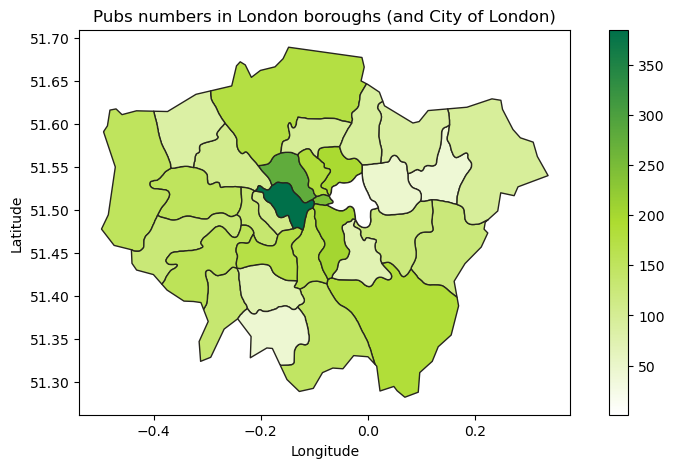

In [45]:
fig, ax = plt.subplots(1, 1, figsize = (10, 5))
ax.set_facecolor("white")
boroughs_df.plot(ax = ax, column="pubs", cmap = custom_cmap, edgecolor = color_list[3], linewidth = 1, legend=True),
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("Pubs numbers in London boroughs (and City of London)")
plt.show()

We can divide the number of pubs per area to get the actual pubs density / square km.

In [46]:
boroughs_df["pubs per sq.km"] = boroughs_df["pubs"] / boroughs_df["area"]

We will use a logarithmic scale, to see better the skewed distribution.

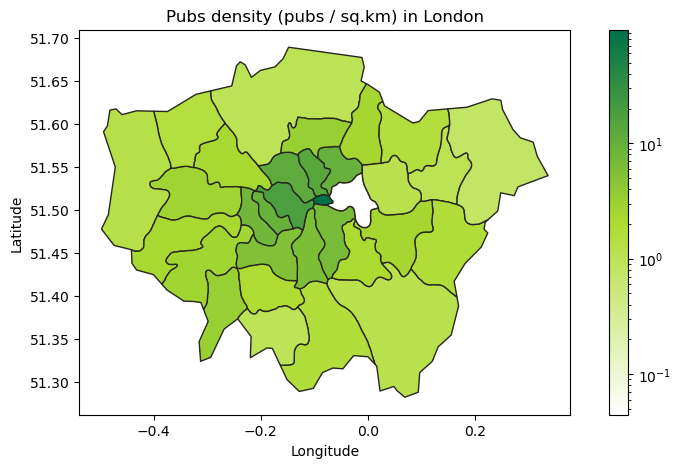

In [47]:
fig, ax = plt.subplots(1, 1, figsize = (10, 5))
ax.set_facecolor("white")
boroughs_df.plot(ax = ax, column="pubs per sq.km", 
                 norm=matplotlib.colors.LogNorm(vmin=boroughs_df["pubs per sq.km"].min(),\
                                          vmax=boroughs_df["pubs per sq.km"].max()),
                 cmap = custom_cmap, edgecolor = color_list[3], 
                 linewidth = 1, legend=True),
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("Pubs density (pubs / sq.km) in London")
plt.show()

We can observe that both the number of pubs as well as pubs density is very small in one of the boroughs, Tower Hamlets. Here is only one pub.  


Let's now count the number of pubs per each Starbucks area.


In [48]:
from shapely.geometry import Point
def pubs_within(polygon):
    return sum(pub_df.apply(lambda x: Point(x["longitude"], x["latitude"]).within(polygon), axis=1))

In [49]:
coffee_voronoi_polys_clipped["pubs"] = coffee_voronoi_polys_clipped["geometry"].apply(lambda x: pubs_within(x))

We generate again the colormap, with the new minimum and maximum number of pubs per `region`.

In [50]:
vmin = coffee_voronoi_polys_clipped.pubs.min()
vmax = coffee_voronoi_polys_clipped.pubs.max()
norm=plt.Normalize(vmin, vmax)
custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white", color_list[0], color_list[2]])

Number of pubs per Starbucks region.

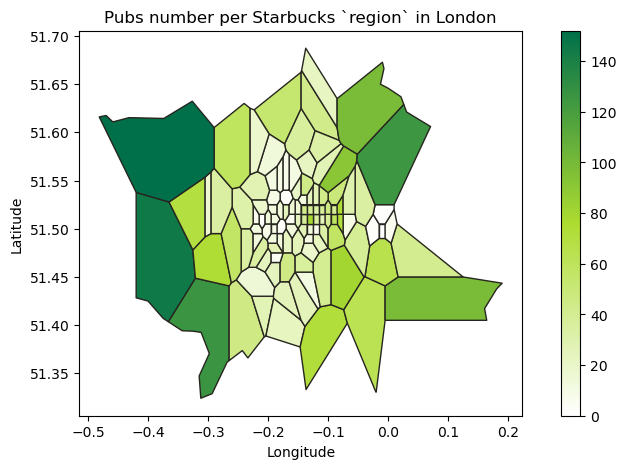

In [51]:
fig, ax = plt.subplots(1, 1, figsize = (10, 5))
ax.set_facecolor("white")
coffee_voronoi_polys_clipped.plot(ax = ax, column="pubs", 
                 cmap = custom_cmap, edgecolor = color_list[3], 
                 linewidth = 1, legend=True),
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("Pubs number per Starbucks `region` in London")
plt.show()

For the pubs density per Starbucks area, we are using a log scale. To avoid issue with 0, we add to the min value 0.1.

In [52]:
coffee_voronoi_polys_clipped = get_polygons_area(coffee_voronoi_polys_clipped)
coffee_voronoi_polys_clipped["pubs per sq.km"] = coffee_voronoi_polys_clipped["pubs"] / coffee_voronoi_polys_clipped["area"]

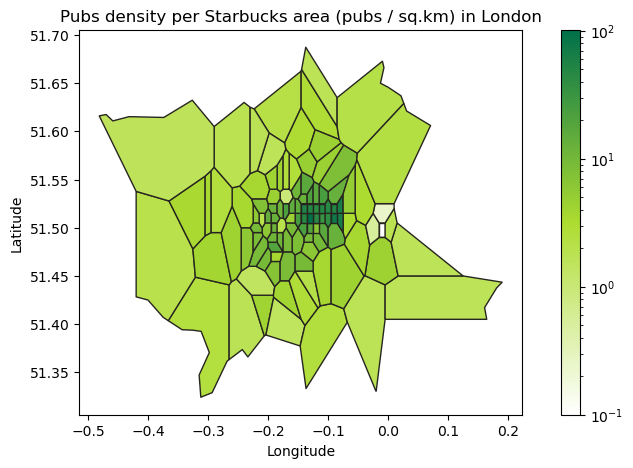

In [53]:
fig, ax = plt.subplots(1, 1, figsize = (10, 5))
ax.set_facecolor("white")
coffee_voronoi_polys_clipped.plot(ax = ax, column="pubs per sq.km", 
                 norm=matplotlib.colors.LogNorm(vmin=coffee_voronoi_polys_clipped["pubs per sq.km"].min()+0.1,\
                                          vmax=coffee_voronoi_polys_clipped["pubs per sq.km"].max()),
                 cmap = custom_cmap, edgecolor = color_list[3], 
                 linewidth = 1, legend=True),
plt.xlabel("Longitude"); plt.ylabel("Latitude");
plt.title("Pubs density per Starbucks area (pubs / sq.km) in London")
plt.show()

---
<div style="float: right;">
        <a href="#0" class="button btn-info btn-sm" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="Go to Top">Go to Top</a>
</div>

# <a id="5">Summary of findings</a>


We learned how to work with geographical information and maps, how to manipulate geometry data (clip and merge polygons data, cluster data to generate maps with less details, remove subsets of geospatial data), superpose several layers of data over maps.  
We also learned how to modify and extract information from shapefile using geopandas and custom code as well as creating or calculating geospatial features, like terrain area or geospatial objects density.
We learned how to visualize the extracted information using geopandas maps with plot as well as multi-layered folium maps. 


---
<div style="float: right;">
        <a href="#0" class="button btn-info btn-sm" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="Go to Top">Go to Top</a>
</div>